In [37]:
import h5py as hd
import numpy as np
import sys
sys.path.append('./lib/')
sys.path.append('./lib/TASK_2_UC1/')
from mlta import *
import skimage

In [38]:
SOURCE = '/mnt/nas3/bigdatasets/Histopathology_Segmentations/'

In [39]:
cam16 = hd.File('/home/mara/adversarialMICCAI/data/ultrafast/cam16_500/patches.h5py',  'r', libver='latest', swmr=True)
all500 = hd.File('/home/mara/adversarialMICCAI/data/ultrafast/all500/patches.h5py',  'r', libver='latest', swmr=True)
extra17 = hd.File('/home/mara/adversarialMICCAI/data/ultrafast/extra17/patches.h5py',  'r', libver='latest', swmr=True)
tumor_extra17=hd.File('/home/mara/adversarialMICCAI/data/ultrafast/1129-1155/patches.h5py', 'r', libver='latest', swmr=True)
test2 = hd.File('/mnt/nas2/results/IntermediateResults/Camelyon/ultrafast/test_data2/patches.hdf5', 'r', libver='latest', swmr=True)
pannuke= hd.File('/mnt/nas2/results/IntermediateResults/Camelyon/pannuke/patches_fix.hdf5', 'r', libver='latest', swmr=True)

global data
data={'cam16':cam16,'all500':all500,'extra17':extra17, 'tumor_extra17':tumor_extra17, 'test_data2': test2, 'pannuke':pannuke}
global concept_db
#concept_db = hd.File('/mnt/nas2/results/IntermediateResults/Mara/MICCAI2020/MELBA_only_correlation_n.hd','r')
concept_db = hd.File('/mnt/nas2/results/IntermediateResults/Mara/MICCAI2020/MELBA_only_contrast_n.hd','r')
#/mnt/nas2/results/IntermediateResults/Mara/MICCAI2020/MELBA_normalized_concepts.hd', 'r')
# Note: nuclei_concepts not supported yet
global nuclei_concepts
nuclei_concepts=hd.File('/mnt/nas2/results/IntermediateResults/Mara/MICCAI2020/normalized_nuclei_concepts_db_new_try_def.hdf5','r')
# DATA SPLIT CSVs
train_csv=open('/mnt/nas2/results/IntermediateResults/Camelyon/train_shuffle.csv', 'r') # How is the encoding of .csv files ?
val_csv=open('/mnt/nas2/results/IntermediateResults/Camelyon/val_shuffle.csv', 'r')
test_csv=open('/mnt/nas2/results/IntermediateResults/Camelyon/test_shuffle.csv', 'r')
train_list=train_csv.readlines()
val_list=val_csv.readlines()
test_list=test_csv.readlines()
test2_csv = open('/mnt/nas2/results/IntermediateResults/Camelyon/test2_shuffle.csv', 'r')
test2_list=test2_csv.readlines()
test2_csv.close()
train_csv.close()
val_csv.close()
test_csv.close()
data_csv=open('./doc/pannuke_data_shuffle.csv', 'r')
data_list=data_csv.readlines()
data_csv.close()
global normalizer
db_name, entry_path, patch_no = get_keys(data_list[0])
normalization_reference_patch = data[db_name][entry_path][patch_no]
normalizer = get_normalizer(normalization_reference_patch)

Using brightness standardization
Normalisers saved to disk.


In [40]:
def load_patch_mask(db_name, entry_path, patch_no, source_fld='', print_img=False):
    list_dirs = os.listdir(source_fld)
    print 'loading: ', db_name, entry_path
    if db_name=='pannuke':
        mask=np.zeros((224,224))
        masks_=data[db_name][entry_path[:-5]+'mask'][0]
        for i in range(5):
            mask+=masks_[:,:,i]
        mask=(mask>1.)*1.
        return mask, connected_components(mask)
    for dir_ in list_dirs:
        if 'patches' in dir_:
            dir_db = dir_.split('patches_')[1]
            if db_name==dir_db:    source_fld=os.path.join(source_fld, dir_)
    idx=0
    patient_path=entry_path.split('/')
    while 'patient' not in patient_path[idx]: 
        idx+=1
    idx+=1
    patient_path_=''
    for i in range(idx):
        patient_path_+=patient_path[i]+'/'
    for subdir in os.listdir(os.path.join(source_fld,patient_path_)):
        if 'node' in subdir:
            patient_path_+=patient_path[idx]
            break
    path_=os.path.join(source_fld,patient_path_)
    #print path_  
    
    mask=np.zeros((224,224,4))
    patch_path=os.path.join(path_,'{}'.format(patch_no))
    for nuclei_mask in os.listdir(patch_path):
        mask += plt.imread(patch_path+'/'+nuclei_mask)
    if print_img:
        plt.figure()
        plt.imshow(all500[dblist[0]][patch_idx])
        plt.imshow(mask, alpha=0.4)
    n_nuclei=len(os.listdir(patch_path))
    return mask, n_nuclei
def load_patch_mask_cam16(patch_address, patch_idx, source_fld='', print_img=False):
    mask=np.zeros((224,224,4))
    patch_path=source_fld+patch_address.split('/patches')[0]+'/{}'.format(patch_idx) 
    #print patch_path
    for nuclei_mask in os.listdir(patch_path):
        mask += plt.imread(patch_path+'/'+nuclei_mask)
    if print_img:
        plt.figure()
        plt.imshow(all500[dblist[0]][patch_idx])
        plt.imshow(mask, alpha=0.4)
    n_nuclei=len(os.listdir(patch_path))
    return mask, n_nuclei

In [41]:
def connected_components(image):
    # list of tags we have used 
    tags = []
    # current  tag (remember 1 and 0 are already in image so start from 2)
    tag = 2
    # counter
    cntr = 0
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if image[i, j] != 0:
                if i != 0 and j != 0 and image[i, j-1] != 0 and image[i-1, j] != 0 and image[i-1, j] != image[i, j-1]:
                    image[i, j] = image[i, j - 1]
                    tags.remove(image[i - 1, j])
                    cntr -= 1
                    image[image == image[i - 1, j]] = image[i, j]
                elif i != 0 and image[i-1, j] != 0:
                    image[i, j] = image[i-1, j]
                elif j != 0 and image[i, j-1] != 0:
                    image[i, j] = image[i, j-1]
                else:
                    image[i, j] = tag
                    tags.append(tag)
                    tag += 1
                    cntr += 1
    return cntr

def get_region_measure(img, mask=None, mtype=None, verbose=False):
    if mtype=='contrast' or mtype=='correlation':
        print 'in'
        def get_masked_texture(img, mask, method='contrast'):
            #if len(img.shape)<3:
            #    gray_img=image
            #else:
            gray_img=cv2.cvtColor(np.uint8(img), cv2.COLOR_BGR2GRAY)
            if len(mask.shape)>2:
                mask=mask[:,:,0]
            copy = np.asarray(mask, dtype=np.float32).copy()
            if np.max(copy)>1.:
                copy/=255.0
            copy[mask==0] = -1
            isolated_grayscale_mask = gray_img*mask/255.0
            isolated_grayscale_mask[copy==-1]=257
            p_image = np.asarray(isolated_grayscale_mask, dtype=np.int)
            glcm = skimage.feature.greycomatrix(p_image, [5], [0], np.max(p_image)+1, symmetric=True, normed=True)
            glcm=glcm[:256,:256]
            return skimage.feature.greycoprops(glcm, method)[0,0]
        return get_masked_texture(img, mask, method=mtype)
    try:
        len(mask)
    except:
        mask = binarize_image(img)
        return get_region_measure(img, mask=mask, mtype=mtype, verbose=False)
    measure_properties = skimage.measure.regionprops(mask)[0]
    return measure_properties[mtype]

def haralick(image, mask=None, mtype=None, verbose=False):
    """
    Compute Haralick's descriptors of the Grey-Level Co-occurences matrix
    """
    # we use standard parameters in the computation of the glcm
    glcm = skimage.feature.greycomatrix(
            skimage.img_as_ubyte(skimage.color.rgb2gray(image)),
            [1],
            [0],
            symmetric=True,
            normed=True)
    return skimage.feature.greycoprops(glcm, mtype)

def get_texture_measure(img, mask=None, mtype=None, verbose=False):
    if mask is not None:
        #print("A mask was specified")
        #print("This feature has been implemented in iMIMIC paper")
        return get_masked_texture(img, mask,method=mtype)
    if mtype is None:
        if verbose:
            print("No type was given")
        return None
    img= np.asarray(img,dtype=np.float32)/255.
    return haralick(img, mask=mask, mtype=mtype, verbose=verbose)[0][0]

In [7]:
%matplotlib inline

In [8]:
#fa=open('./data/cmeasures/narea.csv','w')
#fnc=open('./data/cmeasures/ncount.csv','w')
fncorr=open('./data/cmeasures/nuclei_correlation.csv','w')
fncontr=open('./data/cmeasures/nuclei_contrast.csv','w')
#fcorr=open('./data/cmeasures/full_correlation.csv','w')
#fcontr=open('./data/cmeasures/full_contrast.csv','w')

batch_x = []
batch_y = []
batch_cm = []
avg_area=0
i = 0
while i<len(data_list):
    batch_samples=data_list[i:i+32]
    for line in batch_samples:
        db_name, entry_path, patch_no = get_keys(line)
        patch=data[db_name][entry_path][patch_no]
        original_patch = patch
        patch=normalize_patch(patch, normalizer)
        patch=keras.applications.inception_v3.preprocess_input(patch) #removed bc of BNorm
        ## segmented concepts
        mask, n_nuclei = load_patch_mask(db_name, entry_path, patch_no, source_fld=SOURCE)
        if n_nuclei>0:
            avg_area = get_region_measure(original_patch, mask=np.asarray(mask, dtype=np.int), mtype='area')/n_nuclei
        #fnc.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,n_nuclei))
        #fa.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,avg_area))
        #if db_name=='pannuke':
        #    import pdb; pdb.set_trace()
        contrast = get_region_measure(original_patch, mask=np.asarray(mask, dtype=np.int), mtype='contrast')/n_nuclei
        correlation = get_region_measure(original_patch, mask=np.asarray(mask, dtype=np.int), mtype='correlation')/n_nuclei
        fncontr.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,contrast))
        fncorr.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,correlation))
        fcontrast= get_texture_measure(original_patch, mtype='contrast') 
        #fcorrelation=get_texture_measure(original_patch, mtype='correlation') 
        #fcorr.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,fcorrelation))
        #fcontr.write('{},{},{},{}\n'.format(db_name, entry_path,patch_no,fcontrast))
        #print n_nuclei, avg_area
        label = get_class(line, entry_path) # is there a problem with get_class ?
        batch_x.append(patch)
        batch_y.append(label)
    i+=32
fa.close()
fnc.close()
fncorr.close()
fncontr.close()
fcorr.close()
fcontr.close()


loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  pannuke pannuke/fold1/607/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
i

in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  pannuke pannuke/fold2/281/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  pannuke pannuke/fold1/45/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in


in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
i

in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in

in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/659/normal/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold2/304/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/159/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/401/tumor/upper_right/patch
in
in
loading:

in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  pannuke pannuke/fold2/77/normal/center/patch
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
l

in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  pannuke pannuke/fold1/609/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  pannuke pannuke/fold1/468/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
lo

in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches


in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in

in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/624/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loa

in
in
loading:  pannuke pannuke/fold2/1504/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
load

in
in
loading:  pannuke pannuke/fold1/16/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  pannuke pannuke/fold1/60/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  test_da

in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  pannuke pannuke/fold2/599/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  pannuke pannuke/fold2/65/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  pannuke pannuke/fold2/360/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  pannuke 

in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/85/normal/upper_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in


in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
i

in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  pannuke pannuke/fold1/108/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  pannuke pannuke/fold1/59/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
i

loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  pannuke pannuke/fold1/1712/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold1/46/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  pannuke pannuke/fold1/500/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  pannuke pannuke/fold2/388/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
i

in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loa

loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
lo

in
in
loading:  pannuke pannuke/fold1/285/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/713/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  pannuke pannuke/fold1/400/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  tes

in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  pannuke pannuke/fold2/547/tumor/upper_left/patch
in
in
loading:  pannuke pannuke/fold1/345/normal/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/565/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  pannuke pannuke/fold1/1718/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in

in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  pannuke pannuke/fold2/527/normal/upper_left/patch
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  pannuke pannuke/fold2/597/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
i

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
i

in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  pannuke pannuke/fold2/509/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  pannuke pannuke/fold2/322/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
l

loading:  pannuke pannuke/fold2/109/normal/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/131/normal/lower_left/patch
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  pannuke pannuke/fold2/235/normal/upper_right/patch
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  pannuke pannuke/fold2/483/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient009/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/leve

in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  pannuke pannuke/fold1/928/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  pannuke pannuke/fold1/448/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading

in
in
loading:  pannuke pannuke/fold2/240/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient051/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches

loading:  pannuke pannuke/fold1/1696/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  pannuke pannuke/fold1/80/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in

in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  pannuke pannuke/fold2/287/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  

in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  pannuke pannuke/fold1/561/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
lo

in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
i

in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  pannuke pannuke/fold1/13/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  pannuke pannuke/fold2/144/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  pannuke pannuke/fold1/215/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in


loading:  pannuke pannuke/fold2/111/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient016/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold1/82/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  pannuke pannuke/fold1/308/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 n

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loa

in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  pannuke pannuke/fold2/562/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading: 

loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  pannuke pannuke/fold1/307/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches

in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  pannuke pannuke/fold1/716/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loadin

loading:  pannuke pannuke/fold2/1515/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold1/377/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  pannuke pannuke/fold2/221/normal/center/patch
in
in
loading:  pannuke pannuke/fold1/718/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 

in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in

in
in
loading:  pannuke pannuke/fold1/647/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in

in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold2/1532/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in

loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  pannuke pannuke/fold1/318/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loa

in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
l

in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/504/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  pannuke pannuke/fold1/565/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  e

in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  pannuke pannuke/fold1/501/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
load

in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/675/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  pannuke pannuke/fold1/718/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 norm

in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold2/88/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading: 

in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  pannuke pannuke/fold2/635/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
lo

in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  pannuke pannuke/fold2/1523/normal/center/patch
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  e

in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  pannuke pannuke/fold1/32/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  tu

in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in


in
in
loading:  pannuke pannuke/fold2/530/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading

in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  pannuke pannuke/fold1/1726/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading

loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  

loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  pannuke pannuke/fold2/34/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  al

in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loa

in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches

in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patch

in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  pannuke pannuke/fold2/394/tumor/upper_left/patch
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold2/64/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/305/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in

in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches


in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  pannuke pannuke/fold2/154/normal/upper_right/patch
in
in
loading:  pannuke pannuke/fold2/327/normal/center/patch
in
in
loading:  pannuke pannuke/fold1/72/normal/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  all500 tumor/l

in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  pannuke pannuke/fold2/449/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  pannuke pannuke/fold2/156/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches


in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/482/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in

in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in

in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
l

in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  pannuke pannuke/fold1/298/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/338/tumor/upper_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in


in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches

in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches


in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/225/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  pannuke pannuke/fold2/184/normal/upper_left/patch
in
in
loading:  pannuke pannuke/fold2/24/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  pannuke pannuke/fold2/78/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal

in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  pannuke pannuke/fold1/217/normal/upper_left/patch
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  pannuke pannuke/fold2/277/normal/upper_right/patch
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
lo

in
in
loading:  pannuke pannuke/fold1/149/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/216/normal/lower_left/patch
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  pannuke pannuke/fold2/1505/normal/lower_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold1/148/normal/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/603/tumor/upper_right/patch
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading

in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  pannuke pannuke/fold1/161/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
l

in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  pannuke pannuke/fold2/91/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all

in
in
loading:  pannuke pannuke/fold2/490/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold1/300/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra

in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
lo

loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  pannuke pannuke/fold2/140/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/65/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  pannuke pannuke/fold1/13/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 no

in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  pannuke pannuke/fold1/443/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loa

loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1699/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  pannuke pannuke/fold1/385/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches

in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  pannuke pannuke/fold1/1697/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
load

in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  pannuke pannuke/fold2/200/normal/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  pannuke pannuke/fold1/539/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  e

in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  pannuke pannuke/fold1/479/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/26/tumor/lower_left/patch
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
load

in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/361/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  e

in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  pannuke pannuke/fold2/185/normal/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loa

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches

in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/145/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading: 

in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/369/tumor/center/patch
in
in
loading:  pannuke pannuke/fold1/4/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/642/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal

in
in
loading:  pannuke pannuke/fold1/408/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  pannuke pannuke/fold2/561/tumor/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/785/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  pannuke pannuke/fold2/504/tumor/center/patch
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  pannuke pannuke/fold2/11/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  pannuke pannuke/fold2/201/normal/upper_right/patch
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/l

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
i

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  pannuke pannuke/fold1/331/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches

in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
l

in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches


in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold1/656/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/906/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  pannuke pannuke/fold1/469/tumor/center/patch
in
in
loading:  pannuke pannuke/fold2/246/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  cam16 tum

in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  pannuke pannuke/fold2/603/tumor/lower_right/patch
in
in


in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  pannuke pannuke/fold2/315/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  pannuke pannuke/fold2/147/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in


in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  pannuke pannuke/fold1/4/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  pannuke pannuke/fold1/302/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/439/normal/lower_left/patch
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extr

in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/142/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/501/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:

loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loadi

loading:  pannuke pannuke/fold2/179/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  pannuke pannuke/fold2/207/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 nor

in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  pannuke pannuke/fold1/440/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  pannuke pannuke/fold2/488/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in


loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold2/226/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  pannuke pannuke/fold1/171/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  pannuke pannuke/fold2/56/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/530/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  

in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  pannuke pannuke/fold2/781/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  pannuke pannuke/fold2/280/tumor/lower_right/patch
in
in
load

in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  pannuke pannuke/fold1/1715/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  pannuke pannuke/fold2/671/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/645/tumor/upper_left/patch
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  pannuke pannuke/fold1/176/normal/upper_right/patch
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  pannuke pannuke/fold1/1698/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
i

in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in

in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loa

in
in
loading:  pannuke pannuke/fold2/260/tumor/center/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/350/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  pannuke pannuke/fold1/134/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loadin

loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  pannuke pannuke/fold1/620/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  pannuke pannuke/fold1/97/tumor/center/patch
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  pannuke pannuke/fold2/372/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  pannuke pannuke/fold1/369/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  pannuke pannuke/fold2/240/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading: 

loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  pannuke pannuke/fold1/728/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/898/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  pannuke pannuke/fold1/642/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  

in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in


in
in
loading:  pannuke pannuke/fold1/326/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  e

in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in

loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
i

loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loa

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  pannuke pannuke/fold2/783/tumor/lower_left/patch
in
in
loading:

in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in

in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  pannuke pannuke/fold1/443/tumor/lower_left/patch
in
in
lo

in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  pannuke pannuke/fold1/256/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  pannuke pannuke/fold2/1507/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  ext

in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  pannuke pannuke/fold2/821/tumor/center/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading: 

in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patch

in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  pannuke pannuke/fold2/217/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  pannuke pannuke/fold2/36/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  pannuke pannuke/fold2/197/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  pannuke pannuke/fold1/367/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold1/717/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  pannuke pannuke/fold2/656/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/239/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
i

in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  pannuke pannuke/fold1/704/tumor/upper_left/patch
in
in
loading:  pannuke pannuke/fold1/148/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  c

in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches


in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in

in
in
loading:  pannuke pannuke/fold1/240/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/417/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/

in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patche

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/306/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  pannuke pannuke/fold2/590/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loadi

in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in

in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
i

in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches


in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold2/419/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  pannuke pannuke/fold2/47/normal/center/patch
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
i

loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  pannuke pannuke/fold2/199/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in


in
in
loading:  pannuke pannuke/fold2/452/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loadi

loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  pannuke pannuke/fold2/564/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  pannuke pannuke/fold1/632/normal/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 

in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
i

in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  pannuke pannuke/fold1/377/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
l

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  pannuke pannuke/fold1/466/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  ex

in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  pannuke pannuke/fold1/539/normal/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  pannuke pannuke/fold2/623/normal/upper_right/patch
in
in
loading:  extra17 

in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  pannuke pannuke/fold2/235/normal/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  pannuke pannuke/fold1/566/normal/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/139/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  tumor_extr

in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in


loading:  pannuke pannuke/fold2/72/tumor/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  pannuke pannuke/fold1/247/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  cam1

in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  pannuke pannuke/fold1/527/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in

in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold2/60/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in

in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patche

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  pannuke pannuke/fold1/393/tumor/lower_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in


in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  pannuke pannuke/fold2/482/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/1551/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  ext

loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/643/tumor/upper_left/patch
in
in
loading:

in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
i

in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loa

loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in


in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold2/398/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  a

loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  pannuke pannuke/fold1/366/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  pannuke pannuke/fold1/563/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in


in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches

in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  pannuke pannuke/fold2/130/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  pannuke pannuke/fold1/45/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17

in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  pannuke pannuke/fold1/207/normal/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  pannuke pannuke/fold1/257/normal/lower_left/patch
in
in
loading:  all500 

in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches


in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in


in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
load

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold2/108/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loadi

in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in

in
in
loading:  pannuke pannuke/fold2/38/normal/upper_left/patch
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold2/219/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  pannuk

in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading

in
in
loading:  pannuke pannuke/fold1/87/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  pannuke pannuke/fold2/302/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
load

in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/372/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  pannuke pannuke/fold1/135/normal/lower_right/patch
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold1/1735/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/613/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level

in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  pannuke pannuke/fold2/464/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  pannuke pannuke/fold1/617/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading

loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  pannuke pannuke/fold1/448/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  pannuke pannuke/fold1/1711/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
lo

in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
load

in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patc

in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/311/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loa

in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold2/327/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  pannuke pannuke/fold1/341/tumor/upper_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in

in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in


in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  pannuke pannuke/fold2/470/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:

in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  pannuke pannuke/fold1/547/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches


loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/380/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/610/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  pannuke pannuke/fold1/322/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
l

loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  pannuke pannuke/fold2/376/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 n

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  pannuke pannuke/fold2/479/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/228/normal/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
i

in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in

in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/314/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  pannuke pannuke/fold1/457/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  pannuke pannuke/fold1/387/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  pannuke pannuke/fold1/628/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 

in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1696/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  pannuke pannuke/fold2/129/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
load

in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loa

in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  pannuke pannuke/fold2/145/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  pannuke pannuke/fold2/257/tumor/center/patch
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
l

in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
l

in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in

loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  pannuke pannuke/fold1/302/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  pannuke pannuke/fold1/360/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  pannuke pannuke/fold1/1739/tumor/upper_right/patch
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  pannuke pannuke/fold1/368/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  all500 norm

in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  pannuke pannuke/fold2/50/normal/lower_right/patch
in
in
loading:  pannuke pannuke/fold1/89/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  pannuke pannuke/fold2/481/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/194/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in


loading:  pannuke pannuke/fold1/339/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/107/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  pannuke pannuke/fold2/517/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  pannuke pannuke/fold2/650/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading

in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/730/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  pannuke pannuke/fold2/161/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  pannuke pannuke/fold2/468/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  pannuke pannuke/fold1/713/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  a

in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
load

in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  pannuke pannuke/fold1/1687/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
lo

in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
i

in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  pannuke pannuke/fold1/425/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  al

in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loadi

in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  pannuke pannuke/fold1/292/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patche

in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches


in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in

in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loadi

loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  pa

in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
i

in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patch

in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  pannuke pannuke/fold1/105/normal/lower_right/patch
in
in
loading

in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  pannuke pannuke/fold2/435/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extr

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold1/471/tumor/center/patch
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  al

in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  pannuke pannuke/fold2/640/normal/lower_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/14/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading: 

in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patche

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in


loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/254/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/146/tumor/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  c

in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  pannuke pannuke/fold1/221/normal/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in


in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
l

in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  pannuke pannuke/fold2/450/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold2/12/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  pannuke pannuke/fold2/440/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  pannuke pannuke/fold1/118/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loa

in
in
loading:  pannuke pannuke/fold2/262/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
l

in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  pannuke pannuke/fold2/596/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold1/365/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  pannuke pannuke/fold2/66/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  pannuke pannuke/fold2/246/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold2/33/normal/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold2/239/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/404/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  

in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  pannuke pannuke/fold2/507/tumor/upper_left/patch
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra

in
in
loading:  pannuke pannuke/fold2/155/normal/center/patch
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17

loading:  pannuke pannuke/fold2/550/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:

in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
load

in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  pannuke pannuke/fold2/385/tumor/upper_left/patch
in
in
loading: 

in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  pannuke pannuke/fold2/14/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  pannuke pannuke/fold1/409/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  pannuke pannuke/fold2/334/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam

in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  pannuke pannuke/fold1/547/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/72/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  pannuke pannuke/fold2/30/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tum

in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patc

in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/237/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loadin

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
i

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
i

loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
l

in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  pannuke pannuke/fold1/1690/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
l

loading:  pannuke pannuke/fold1/492/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold1/632/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  pannuke pannuke/fold1/540/tumor/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches

in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1734/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  pannuke pannuke/fold2/243/normal/upper_left/patch
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold2/661/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patche

in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches

in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
i

in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  pannuke pannuke/fold2/545/normal/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/519/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  pannuke pannuke/fold1/733/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam1

in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
l

loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  pannuke pannuke/fold1/382/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:

in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  pannuke pannuke/fold1/540/tumor/upper_right/patch
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
i

in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  pannuke pannuke/fold1/1730/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  a

in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
i

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  pannuke pannuke/fold1/491/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
lo

loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  pannuke pannuke/fold1/391/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/423/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  pannuke pannuke/fold2/279/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
load

loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node

in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
lo

loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold2/781/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/490/tumor/lower_left/patch
in
in
loadin

in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  pannuke pannuke/fold2/407/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold1/1727/tumor/upper_left/patch
in
in
loading:  pannuke pannuke/fold1/1681/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  p

in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold1/50/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading

in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  pannuke pannuke/fold1/81/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
i

in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in

in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  pannuke pannuke/fold1/568/normal/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in


in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  pannuke pannuke/fold1/222/normal/center/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading

in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  pannuke pannuke/fold2/233/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
l

in
in
loading:  pannuke pannuke/fold1/215/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
i

loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold2/96/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  

in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/pa

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  pannuke pannuke/fold1/557/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
load

loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  pannuke pannuke/fold1/390/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
l

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  pannuke pannuke/fold1/536/tumor/upper_right/patch
in
in
loadin

loading:  pannuke pannuke/fold1/594/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  pannuke pannuke/fold2/1545/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  pannuke pan

in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  pannuke pannuke/fold2/347/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  

loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  pannuke pannuke/fold2/261/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  pannuke pannuke/fold2/1543/normal/lower_left/patch
in
in
loadin

loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  pannuke pannuke/fold1/30/tumor/center/patch
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/72/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  tumor_extra17 t

in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold1/908/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold2/2/tumor/upper_left/patch
in
in
loadi

in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/325/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loa

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in


in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  pannuke pannuke/fold2/632/tumor/upper_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  pannuke pannuke/fold2/28/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  pannuke pannuke/fold1/554/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold2/129/normal/upper_left/patch
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/136/normal/upper_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold2/342/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold1/1723/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in

in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/1546/normal/lower_left/patch
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  pannuke pannuke/fold1/405/tumor/upper_right/patch
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  pannuke pannuke/fold1/706/tumor/upper_left/patch
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  pannuke pannuke/fold1/236/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
lo

loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in

in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  pannuke pannuke/fold2/392/tumor/upper_left/patch
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  pannuke pannuke/fold2/168/normal/center/patch
in
in
loading:  extra17 norm

loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  pannuke pannuke/fold2/106/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  pannuke pannuke/fold1/408/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold2/554/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra

in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/674/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  pannuke pannuke/fold2/1508/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in


in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  pannuke pannuke/fold1/1736/tumor/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
l

loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/624/normal/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/315/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  pannuke pannuke/fold2/652/tumor/center/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  pan

in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  pannuke pannuke/fold2/400/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  pannuke pannuke/fold2/625/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  pannuke pannuke/fold2/1533/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches

in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
l

in
in
loading:  pannuke pannuke/fold1/664/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  pannuke pannuke/fold2/404/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  pannuke pannuke/fold2/419/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  pannuke pannuke/fold2/332/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  pannuke pannuke/fold1/96/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/238/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patch

in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  pannuke pannuke/fold1/629/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading

in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  pannuke pannuke/fold1/1695/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/258/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  pannuke pannuke/fold1/63/normal/upper_right/patch
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/143/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam1

in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/545/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  pannuke pannuke/fold2/53/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loadin

loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  pannuke pannuke/fold1/253/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/94/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  pannuke pannuke/fold1/466/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold2/350/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/239/normal/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/1537/normal/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 

loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  

in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  pannuke pannuke/fold2/390/normal/lower_right/patch
in
in
loa

in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  pannuke pannuke/fold2/1/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  pannuke pannuke/fold1/202/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
i

loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  pannuke pannuke/fold2/96/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patch

in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  pannuke pannuke/fold1/634/normal/center/patch
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  pannuke pannuke/fold2/348/tumor/lower_right/patch
in
in
loading:  extra

in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  pannuke pannuke/fold2/315/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loa

in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  pannuke pannuke/fold2/192/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  pannuke pannuke/fold1/261/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  pannuke pannuke/fold1/410/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/668/tumor/lower_right/patch
in
in
loading:  extra17

in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  pannuke pannuke/fold1/543/tumor/upper_left/patch
in
in
loading:  al

in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  pannuke pannuke/fold1/1728/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  pannuke pannuke/fold2/439/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  e

in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in

in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/

in
in
loading:  pannuke pannuke/fold2/1520/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  pannuke pannuke/fold2/296/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  tumor_

in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  pannuke pannuke/fold1/394/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patche

in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  pannuke pannuke/fold1/160/normal/upper_left/patch
in
in

in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  pannuke pannuke/fold1/651/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/pat

in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/70/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
loadi

in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  pannuke pannuke/fold1/708/tumor/center/patch
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra1

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/620/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  pannuke pannuke/fold1/454/tumor/center/patch
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
i

in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  pannuke pannuke/fold2/669/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
i

in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches


in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches


in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  pannuke pannuke/fold2/788/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in


in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patche

loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  pannuke pannuke/fold1/94/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  pannuke pannuke/fold2/1550/tumor/upper_right/patch
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/446/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/336/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/152/normal/lower_left/patch
in
in
loading:  pannuke pannuke/fold1/237/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  pannuke pannuke/fold1/21/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  a

in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  pannuke pannuke/fold1/661/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in

in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches

in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in


in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loa

in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  pannuke pannuke/fold2/498/normal/lower_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  pannuke pannuke/fold2/263/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches


in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  pannuke pannuke/fold2/392/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading: 

in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches


in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  pannuke pannuke/fold1/450/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
l

in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  pannuke pannuke/fold2/792/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold2/341/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 

in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/726/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/537/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  ext

in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in


in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in

loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  pannuke pannuke/fold2/1543/normal/lower_right/patch
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  pannuke pannuke/fold2/592/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/88/normal/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 no

in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  pannuke pannuke/fold1/241/normal/lower_left/patch
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
l

in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/1542/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches

in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  pannuke pannuke/fold2/557/tumor/upper_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  pannuke pannuke/fold1/294/normal/center/patch
in
in
loading:  pannuke pannuke/fold2/232/normal/upper_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  pannuke pannuke/fold2/330/tumor/center/patch
in
in
loading:  cam16 t

in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loadi

loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  pannuke pannuke/fold1/1732/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/1520/normal/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  all500 normal

in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold1/498/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  pannuke pannuke/fold2/44/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/169/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loadi

in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in

in
in
loading:  pannuke pannuke/fold2/180/normal/upper_left/patch
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in


in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  pannuke pannuke/fold1/301/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold2/436/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold2/559/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/99/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patch

in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches


in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold2/544/normal/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/403/tumor/center/patch
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  pannuke pannuke/fold2/498/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patc

in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patch

in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold2/1515/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  pannuke pannuke/fold1/404/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  pannuke pannuke/fold2/444/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  pannuke pannuke/fold1/629/tumor/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  pannuke pannuke/fold1/390/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  ex

loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1734/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  pannuke pannuke/fold2/40/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/20/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patche

in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  pannuke pannuke/fold1/521/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  e

loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  pannuke pannuke/fold1/105/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  ex

in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  pannuke pannuke/fold2/171/normal/lower_left/patch
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  pannuke pannuke/fold1/654/tumor/center/patch
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  pannuke pannuke/fold2/55/normal/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
lo

in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in


in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  pannuke pannuke/fold1/238/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  pannuke pannuke/fold1/402/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold1/1744/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 

in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  pannuke pannuke/fold2/193/normal/center/patch
in
in
loading:  pannuke pannuke/fold2/423/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17

in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  pannuke pannuke/fold2/489/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  pannuke pannuke/fold1/1730/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1725/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold2/577/tumor/center/patch
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  ext

in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  pannuke pannuke/fold2/11/tumor/upper_left/patch
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading

loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  pannuke pannuke/fold1/186/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  

in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  pannuke pannuke/fold1/319/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  pannuke pannuke/fold2/388/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  pannuke pannuke/fold1/387/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  pannuke pannuke/fold1/312/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  pannuke pannuke/fold2/418/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches


in
in
loading:  pannuke pannuke/fold2/22/normal/lower_right/patch
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches


in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold2/206/normal/lower_left/patch
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loa

in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1686/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loadi

in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  pannuke pannuke/fold2/162/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  pannuke pannuke/fold1/352/tumor/center/patch
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  ex

in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in

in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  pannuke pannuke/fold1/424/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:

in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  pannuke pannuke/fold2/481/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
lo

in
in
loading:  pannuke pannuke/fold2/334/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  pannuke pannuke/fold1/556/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading

loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  pannuke pannuke/fold2/1531/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches


in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
lo

loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  pannuke pannuke/fold1/692/tumor/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  pannuke pannuke/fold2/313/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra

in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in


loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  pannuke pannuke/fold1/1747/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 

in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  pannuke pannuke/fold2/206/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  pannuke pannuke/fold1/539/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loadin

loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient060_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  pannuke pannuke/fold1/337/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in

in
in
loading:  pannuke pannuke/fold1/673/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  pannuke pannuke/fold2/148/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  pannuke pannuke/fold1/551/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 no

in
in
loading:  pannuke pannuke/fold2/201/normal/upper_left/patch
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in

in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold1/1733/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  pannuke pannuke/fold1/445/normal/lower_right/patch
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  pannuke pannuke/fold1/572/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  pannuke pannuke/fold1/243/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  

in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  pannuke pannuke/fold2/443/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in


in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  pannuke pannuke/fold1/372/tumor/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading

in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in

in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  pannuke pannuke/fold1/587/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  pannuke pannuke/fold2/319/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 no

in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patche

in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
lo

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patch

in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in

in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patche

in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  pannuke pannuke/fold1/131/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  pannuke pannuke/fold1/64/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/323/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  pannuke pannuke/fold1/654/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/245/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loadi

loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  pannuke pannuke/fold1/477/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
l

in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold1/618/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  pannuke pannuke/fold2/233/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  pannuke pannuke/fold1/668/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loa

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches


in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  pannuke pannuke/fold2/91/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loa

in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  pannuke pannuke/fold2/144/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in

in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  pannuke pannuke/fold2/1505/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
load

in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
i

in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  pannuke pannuke/fold1/904/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  pannuke pannuke/fold2/200/normal/lower_right/patch
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
i

in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loa

in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
i

in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  pannuke pannuke/fold1/511/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold2/269/tumor/lower_left/patch
in
in
loading:  e

in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  pannuke pannuke/fold1/435/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  pannuke pannuke/fold1/49/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  

in
in
loading:  pannuke pannuke/fold2/622/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/267/tumor/upper_right/patch
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches


in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
i

in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  pannuke pannuke/fold2/644/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  pannuke pannuke/fold2/74/normal/upper_left/patch
in
in
loading:  all50

in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  pannuke pannuke/fold1/585/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches

in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  pannuke pannuke/fold1/457/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/473/tumor/lower_left/patch
in
in
loading

loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loa

in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/242/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/pat

in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
i

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  pannuke pannuke/fold2/51/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all5

in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  pannuke pannuke/fold1/652/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  pannuke pannuke/fold1/1718/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
lo

loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  pannuke pannuke/fold1/525/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  pannuke pannuke/fold1/272/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  pannuke pannuke/fold1/1696/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loadin

in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/145/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/106/normal/upper_right/patch
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  pannuke pannuke/fold2/567/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  pannuke pannuke/fold1/137/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  ext

in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  pannuke pannuke/fold2/671/tumor/lower_right/patch
in
in
loading:  pannuke pannuke/fold1/725/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  al

in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  pannuke pannuke/fold1/1716/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loadin

in
in
loading:  pannuke pannuke/fold1/1709/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  pannuke pannuke/fold2/127/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/227/normal/center/patch
in
in
loading:  pannuke pannuke/fold1/173/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  ext

in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading

in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  pannuke pannuke/fold1/591/tumor/lower_left/patch
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  pannuke pannuke/fold2/290/normal/upper_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in

in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  pannuke pannuke/fold2/641/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
lo

in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  pannuke pannuke/fold2/394/tumor/lower_left/patch
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loadin

in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/383/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  pannuke pannuke/fold1/704/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  ext

in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in


in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold2/335/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  pannuke pannuke/fold1/69/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
load

in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in

loading:  pannuke pannuke/fold1/225/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  pannu

in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold1/11/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  pannuke pannuke/fold1/682/tumor/upper_left/patch
in
in
loadi

in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  pannuke pannuke/fold2/298/tumor/center/patch
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  pannuke pannuke/fold1/553/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  pannuke pann

in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  pannuke pannuke/fold2/102/tumor/upper_right/patch
in
in
loadi

in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  pannuke pannuke/fold2/331/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  pannuke pannuke/fold2/549/tumor/upper_left/patch
in
in
loading:  pannuke pannuke/fold2/1509/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  t

in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
l

in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  pannuke pannuke/fold1/381/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:

in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in


in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
lo

loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  pannuke pannuke/fold1/37/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold2/59/normal/lower_left/patch
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  pannuke pannuke/fold2/1540/normal/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  pannuke pannuke/fold1/172/tumor/upper_left/patch
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  pannuke pannuke/fold1/208/normal/upper_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  pannuke pannuke/fold1/200/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading: 

in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in


in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  pannuke pannuke/fold1/38/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
load

in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  pannuke pannuke/fold1/553/tumor/upper_left/patch
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  pannuke pannuke/fold2/37/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  pannuke pannuke/fold2/663/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  ca

in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
load

in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  pannuke pannuke/fold1/516/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  pannuke pannuke/fold2/658/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in

in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in

in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  pannuke pannuke/fold2/598/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
load

in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/120/tumor/center/patch
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra1

in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patche

loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  pannuke pannuke/fold1/358/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  pannuke pannuke/fold1/223/normal/upper_right/patch
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  pannuke pannuke/fold1/111/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
i

loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  pannuke pannuke/fold2/786/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  ca

in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/601/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  pannuke pannuke/fold1/339/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/256/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 nor

in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  pannuke pannuke/fold1/188/normal/center/patch
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  ex

in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loadin

loading:  pannuke pannuke/fold2/57/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  pannuke pannuke/fold1/533/tumor/center/patch
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  ext

loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  pannuke pannuke/fold2/225/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in


in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  pannuke pannuke/fold2/295/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/275/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  cam

loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  pannuke pannuke/fold2/129/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  pannuke pannuke/fold1/260/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  pannuke pannuke/fold1/612/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  pannuke pannuke/fold1/468/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  pannuke pannuke/fold1/65/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:

in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
l

in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  pannuke pannuke/fold1/587/tumor/upper_left/patch
in
in
loading

in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
i

in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  pannuke pannuke/fold2/469/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
i

in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
i

in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/297/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  pannuke pannuke/fold2/256/tumor/upper_right/patch
in
in
loading:

in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  pannuke pannuke/fold2/483/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  pannuke pannuke/fold2/330/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  pannu

in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  pannuke pannuke/fold2/152/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
i

in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/pat

in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient063_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/p

in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  pannuke pannuke/fold2/27/normal/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all5

in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in


in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  pannuke pannuke/fold1/604/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  pannuke pannuke/fold2/132/normal/upper_right/patch
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
lo

in
in
loading:  cam16 normal/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/299/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  pannuke pannuke/fold2/652/tumor/upper_left/patch
in
in
loading:  extra17 n

in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/617/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/195/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  pannuke pannuke/fold1/192/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  cam16

in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patche

in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/268/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  pannuke pannuke/fold2/153/normal/upper_right/patch
in
in
loading:  pannuke pannuke/fold1/370/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extr

in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  pannuke pannuke/fold1/453/tumor/upper_right/patch
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:

in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  pannuke pannuke/fold2/208/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
i

in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  pannuke pannuke/fold2/412/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient002_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/62/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  pannuke pannuke/fold2/668/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  ca

in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  pannuke pannuke/fold2/1532/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/18/tumor/lower_right/patch
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches

in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  pannuke pannuke/fold1/710/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/pat

in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/225/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/593/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold2/283/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  pannuke pannuke/fold2/418/normal/lower_left/patch
in
in
l

in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  pannuke pannuke/fold1/59/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient051_Mask.tif/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in


in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in

in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
l

in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/264/tumor/lower_right/patch
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  ext

in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  pannuke pannuke/fold1/15/tumor/lower_right/patch
in
in
loadi

in
in
loading:  pannuke pannuke/fold2/391/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  pannuke pannuke/fold1/582/normal/lower_left/patch
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  pannuke pannuke/fold1/1702/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patche

loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  pannuke pannuke/fold2/602/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  pannuke pannuke/fold1/330/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  cam16 nor

in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in

in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/pa

in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/10/tumor/lower_left/patch
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  pannuke pannuke/fold1/1685/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  pannuke pannuke/fold2/424/normal/lower_left/patch
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  pannuke pannuke/fold2/6/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  e

in
in
loading:  pannuke pannuke/fold2/665/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  pannuke pannuke/fold1/151/normal/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all

in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  pannuke pannuke/fold2/412/tumor/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  pannuke pannuke/fold1/367/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  pannuke pannuke/fold2/1524/normal/lower_right/patch
in


in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  pannuke pannuke/fold1/319/normal/lower_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  pannuke pannuke/fold2/1541/normal/upper_right/patch
in
in
loadi

in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/455/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loadin

in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loadi

in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in


in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  pannuke pannuke/fold2/577/tumor/lower_right/patch
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  pannuke pannuke/fold2/443/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  pannuke pannuke/fold1/177/normal/lower_right/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  cam16 

in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  pannuke pannuke/fold1/237/tumor/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  ext

in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  pannuke pannuke/fold1/578/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
load

in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  pannuke pannuke/fold1/214/normal/center/patch
in
in
loading:  pannuke pannuke/fold2/560/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16

in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold1/359/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in


in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  pannuke pannuke/fold1/278/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  pannuke pannuke/fold2/622/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  pannuke pannuke/fold1/577/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  pannuke pannuke/fold1/1691/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  pannuke pannuke/fold2/92/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/1702/tumor/lower_right/patch
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  pannuke pannuke/fold1/391/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  all50

loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold2/45/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  pannuke pannuke/fold2/591/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches

in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loadi

in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient049_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/0/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches

in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  pannuke pannuke/fold2/53/normal/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  pannuke pannuke/fold1/593/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
i

in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  pannuke pannuke/fold1/559/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  

in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  pannuke pannuke/fold2/237/normal/lower_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
l

in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  pannuke pannuke/fold1/1708/normal/center/patch
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
i

in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  pannuke pannuke/fold1/79/normal/lower_left/patch
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  pannuke pannuke/fold2/243/normal/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  pannuke pannuke/fold1/154/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  pannuke pannuke/fold2/1548/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
l

in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  pannuke pannuke/fold1/1737/tumor/upper_right/patch
in
in
loading

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches


in
in
loading:  extra17 normal/level7/centre0/patient007/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  pannuke pannuke/fold2/165/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  pannuke pannuke/fold1/580/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  pannuke pannuke/fold1/290/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 

in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in


in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/672/tumor/center/patch
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  pannuke pannuke/fold2/1549/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
load

in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient009_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient017_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in

in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in


in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient001_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in

in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient051/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient027_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
l

loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold1/536/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient018/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient011_Mask.tif/patches
in
i

in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  pannuke pannuke/fold1/392/tumor/lower_left/patch
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  e

loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  pannuke pannuke/fold1/1742/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient008/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  pannuke pannuke/fold2/160/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  pannuke pannuke/fold1/106/normal/center/patch
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra

in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  pannuke pannuke/fold1/240/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  pannuke pannuke/fold1/469/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  pan

in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient034/node3/patches
in
in
loading:  pannuke pannuke/fold2/442/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
lo

in
in
loading:  cam16 tumor/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  pannuke pannuke/fold1/527/tumor/lower_left/patch
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  

in
in
loading:  pannuke pannuke/fold2/148/normal/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient024_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/221/normal/upper_left/patch
in
in
loading:  pannuke pannuke/fold2/416/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/46/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 normal/level7

in
in
loading:  pannuke pannuke/fold2/261/tumor/lower_right/patch
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  pannuke pannuke/fold1/295/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient021_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  pannuke pannuke/fold2/8/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in


in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading: 

in
in
loading:  pannuke pannuke/fold1/323/tumor/upper_left/patch
in
in
loading:  all500 normal/level7/centre2/patient040/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  pannuke pannuke/fold1/536/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node0/patches
in
in
loading:  pannuke pannuke/fold2/637/tumor/center/patch
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  pannuke pannuke/fold1/295/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  pannuke pannuke/fold1/172/tumor/lower_left/patch
in
in
loading:  pannuke pannuke/fold2/416/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node4/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  pannuke pannuke/fold2/1555/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loadin

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  pannuke pannuke/fold2/510/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  

in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  pannuke pannuke/fold1/292/tumor/upper_right/patch
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
load

in
in
loading:  pannuke pannuke/fold2/306/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/90/tumor/upper_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node1/patches
in
in
loading:  extr

in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold1/405/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading

in
in
loading:  all500 normal/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/322/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
load

in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in

in
in
loading:  pannuke pannuke/fold1/289/normal/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient041_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient046_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/497/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  cam16

in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/255/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  pannuke pannuke/fold1/717/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient063/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node2/patches
in
in
l

in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  pannuke pannuke/fold1/328/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  pannuke pannuke/fold1/573/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  ex

in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading: 

in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient051_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patc

in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient028/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in


in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  pannuke pannuke/fold1/696/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient033/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading

in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in

in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in


in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient047_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
load

in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  pannuke pannuke/fold1/350/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/209/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  pannuke pannuke/fold1/375/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node0/patches
in
in
loading:  e

in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  pannuke pannuke/fold2/515/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node0/patches
in
in
loading:  pannuke pannuke/fold1/335/normal/center/patch
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17

in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient039/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  pannuke pannuke/fold2/431/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient037_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient048_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in

in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient012_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient064/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
i

in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  pannuke pannuke/fold1/535/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loadin

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node2/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node1/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node0/patches
in
in
loading:  pannuke pannuke/fold2/627/tumor/upper_left/patch
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient023_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient026_Mask.tif/patches
in


in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient016_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient010_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in

in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient076/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loa

in
in
loading:  all500 tumor/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient045_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient062/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
i

in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/694/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient071/node4/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient052/node4/patches
in
in
loading:  all500 tumor/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:

loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  pannuke pannuke/fold2/380/tumor/lower_right/patch
in
in
loading:  cam16 normal/level7/centre0/patient018_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient052_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loadin

in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient067_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  pannuke pannuke/fold2/186/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
lo

loading:  pannuke pannuke/fold2/543/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  pannuke pannuke/fold1/710/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient028_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient058_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  all500 normal/level7/centre3/patient066/node2/patches
in
in
loading:  all500 normal/level7/centre0/patient004/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loa

in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
lo

in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient069_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient066_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches


in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  pannuke pannuke/fold1/28/tumor/upper_left/patch
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient054/node1/patches
in
in
loading:  pannuke pannuke/fold2/249/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold2/437/normal/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node3/patches
in
in
loading:  all50

in
in
loading:  extra17 normal/level7/centre0/patient007/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  pannuke pannuke/fold2/1528/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  pannuke pannuke/fold1/59/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading: 

in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  pannuke pannuke/fold2/52/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient053_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient073/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loadi

in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient067/node1/patches
in
in
lo

in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient026_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  pannuke pannuke/fold1/83/normal/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient050_Mask.tif/patches
in
in
loading

in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  pannuke pannuke/fold1/481/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre1/patient022/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient070_Mask.tif/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  pannuke pannuke/fold1/471/tumor/upper_left/patch
in
in
loading:  all500 tumor/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node4/patches
in
in
loading:  

loading:  pannuke pannuke/fold2/666/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  pannuke pannuke/fold1/105/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient022/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node3/patches
in
in
loading:  al

in
in
loading:  extra17 normal/level7/centre0/patient015/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient011_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node1/patches
in
in
loadin

in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  pannuke pannuke/fold1/576/tumor/upper_right/patch
in
in
loading:  extra17 normal/level7/centre3/patient064/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  all500 tumor/level7/centre0/patient010/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  pannuke pannuke/fold1/1723/normal/upper_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node0/patches
in
in
loadi

in
in
loading:  cam16 normal/level7/centre0/patient022_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient033/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient052/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in


loading:  pannuke pannuke/fold1/721/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre1/patient025/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  pannuke pannuke/fold1/509/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node1/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node3/patches
in
in
loading:  cam16 normal

in
in
loading:  extra17 normal/level7/centre3/patient078/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  all500 tumor/level7/centre3/patient062/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient039/node1/patches
in
in
loading:  pannuke pannuke/fold1/91/normal/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient006_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient027/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  

in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient038/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient044_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
i

in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient004_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  pannuke pannuke/fold2/1553/tumor/upper_right/patch
in
in
loading:  pannuke pannuke/fold2/505/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient011/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node0/patches
in
in
loading:  all50

in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node3/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient066/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient035/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient064_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node2/patches
i

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  all500 tumor/level7/centre2/patient051/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  all500 normal/level7/centre0/patient015/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient021/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in
loading:  pannuke pannuke/fold1/697/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre3/patient070/node2/patches
in
in
loading:  pannuke pannuke/fold1/261/tumor/upper_right/patch
in
in
loading:  extra1

in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node0/patches
in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  pannuke pannuke/fold2/441/tumor/upper_left/patch
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node0/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre2/patient055/node4/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient038/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient032_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  pannuke pannuke/fold1/608/tumor/upper_right/patch
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient009/node3/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient055_Mask.tif/patches
in
in
loading:

loading:  pannuke pannuke/fold1/318/normal/upper_left/patch
in
in
loading:  all500 normal/level7/centre0/patient016/node1/patches
in
in
loading:  test_data2 tumor/level7/centre4/patient081/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node2/patches
in
in
loading:  all500 normal/level7/centre2/patient041/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient005/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  all500 normal/level7/centre2/patient048/node1/patches
in
in
loading:  pannuke pannuke/fold2/401/tumor/lower_left/patch
in
in
loading:  extra17 

in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient005_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient036_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient065/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient062/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
l

in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient046/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient075/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient038_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre0/patient017/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient042_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in

in
in
loading:  cam16 normal/level7/centre0/patient059_Mask.tif/patches
in
in
loading:  test_data2 normal/level7/centre4/patient081/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient061_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node1/patches
in
in
loading:  all500 normal/level7/centre0/patient009/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient020/node4/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node3/pat

in
in
loading:  extra17 normal/level7/centre2/patient054/node2/patches
in
in
loading:  all500 normal/level7/centre1/patient020/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient022/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient030/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient034_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre3/patient072/node0/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in


in
in
loading:  all500 tumor/level7/centre2/patient042/node3/patches
in
in
loading:  pannuke pannuke/fold2/352/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient020/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient024/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node4/patches
in
in
loading:  cam16 normal/level7/centre0/patient025_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient029_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/603/tumor/center/patch
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  extra17 normal/level7/centre0/patient007/node2/patches
in
in
loading:  extra1

in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient057_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient015_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient048/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient065_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node0/patches
in
in
loading:  pannuke pannuke/fold1/276/tumor/lower_right/patch
in
in
loading:  extra17 normal/level7/centre0/patient001/node4/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node3/patches
in
in
loading: 

in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  pannuke pannuke/fold1/196/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient043/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient055_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient013_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient045/node1/patches
in
in
loading:  all500 tumor/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient062_Mask.tif/patches
in
in
loading:

in
in
loading:  extra17 normal/level7/centre2/patient055/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient020/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  pannuke pannuke/fold2/75/normal/upper_right/patch
in
in
loading:  extra17 normal/level7/centre2/patient042/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  pannuke pannuke/fold2/464/tumor/lower_left/patch
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient012/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  all

in
in
loading:  extra17 normal/level7/centre2/patient059/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node3/patches
in
in
loading:  pannuke pannuke/fold1/620/normal/center/patch
in
in
loading:  pannuke pannuke/fold1/490/tumor/upper_left/patch
in
in
loading:  extra17 normal/level7/centre0/patient003/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient024/node3/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient042/node1/patches
in
in
loading:  pannuke pannuke/fold1/512/tumor/upper_left/patch
in
in
loading:  all500 tumor

in
in
loading:  extra17 normal/level7/centre2/patient055/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient004/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient061/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient068/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient056/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient056_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient030_Mask.tif/patches
in
in
loading:  all500 tumor/level7/centre2/patient044/node4/patches
in
in
loading:  pannuke pannuke/fold1/335/normal/upper_right/patch
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  pannuke pannuke/fold1/107/normal/upper_left/patch
in
in
loading:  cam16 normal/level7/centre0/patient014_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient046/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient047/node0/patches
in
in
loading:  

in
in
loading:  pannuke pannuke/fold2/372/tumor/upper_left/patch
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient079/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient016/node4/patches
in
in
loading:  all500 tumor/level7/centre0/patient009/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node4/patches
in
in
loading:  all500 tumor/level7/centre2/patient046/node3/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node3/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient074/node0/patches
in
in
loading

loading:  extra17 normal/level7/centre0/patient007/node1/patches
in
in
loading:  cam16 tumor/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient039/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient020_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient036/node0/patches
in
in
loading:  extra17 normal/level7/centre0/patient003/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient072/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient067/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node0/patches
in
in
loadin

in
in
loading:  all500 normal/level7/centre2/patient042/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node2/patches
in
in
loading:  cam16 normal/level7/centre0/patient033_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre0/patient010/node1/patches
in
in
loading:  extra17 normal/level7/centre1/patient029/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient008/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient002/node3/patches
in
in
loading:  extra17 normal/level7/centre1/patient037/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient023/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient077/node0/patches
in
in
loading:  cam16 normal/level7/centre0/patient054_Mask.tif/patches
in
in
loading:  cam16 tumor/level7/centre0/patient062_Mask.tif/patches
in
in
loading:  all500 normal/level7/centre2/patient044/node4/patches
in
in


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



in
in
loading:  extra17 normal/level7/centre1/patient025/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient044/node0/patches
in
in
loading:  extra17 normal/level7/centre1/patient038/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient059/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient000/node2/patches
in
in
loading:  all500 tumor/level7/centre0/patient015/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  all500 normal/level7/centre3/patient060/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node4/patches
in
in
loading:  all500 normal/level7/centre3/patient068/node1/patches
in
in
loading:  extra17 normal/level7/centre2/patient043/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient060/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient068_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node1/patches
in
in

in
in
loading:  all500 tumor/level7/centre0/patient017/node2/patches
in
in
loading:  all500 tumor/level7/centre1/patient034/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient050/node2/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient049/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient057/node1/patches
in
in
loading:  extra17 normal/level7/centre3/patient078/node3/patches
in
in
loading:  cam16 tumor/level7/centre0/patient039_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient012/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient045/node2/patches
in
in
loading:  cam16 tumor/level7/centre0/patient003_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre3/patient071/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node1/patches
in
in
loading:  tumor_extra17 tumor/level7/centre2/patient040/node2/patches


in
in
loading:  extra17 normal/level7/centre2/patient047/node3/patches
in
in
loading:  cam16 normal/level7/centre0/patient040_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient006/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient021/node3/patches
in
in
loading:  extra17 normal/level7/centre2/patient055/node2/patches
in
in
loading:  extra17 normal/level7/centre2/patient058/node1/patches
in
in
loading:  all500 normal/level7/centre1/patient036/node3/patches
in
in
loading:  extra17 normal/level7/centre3/patient070/node4/patches
in
in
loading:  cam16 tumor/level7/centre0/patient035_Mask.tif/patches
in
in
loading:  cam16 normal/level7/centre0/patient043_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre0/patient001/node0/patches
in
in
loading:  all500 normal/level7/centre3/patient061/node4/patches
in
in
loading:  extra17 normal/level7/centre3/patient073/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient053/node1/patches
in
in
l

in
in
loading:  cam16 tumor/level7/centre0/patient007_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre2/patient041/node2/patches
in
in
loading:  extra17 normal/level7/centre3/patient064/node2/patches
in
in
loading:  extra17 normal/level7/centre1/patient031/node2/patches
in
in
loading:  all500 normal/level7/centre3/patient075/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient032/node2/patches
in
in
loading:  pannuke pannuke/fold2/419/tumor/center/patch
in
in
loading:  cam16 normal/level7/centre0/patient019_Mask.tif/patches
in
in
loading:  extra17 normal/level7/centre1/patient034/node0/patches
in
in
loading:  extra17 normal/level7/centre3/patient069/node4/patches
in
in
loading:  extra17 normal/level7/centre2/patient040/node4/patches
in
in
loading:  extra17 normal/level7/centre1/patient025/node4/patches
in
in
loading:  extra17 normal/level7/centre0/patient013/node0/patches
in
in
loading:  extra17 normal/level7/centre2/patient054/node3/patches
in
in
loading:  

NameError: name 'fa' is not defined

In [ ]:
n_nuclei

In [ ]:
np.sum(mask)

In [ ]:
fa.close()
fnc.close()
fncorr.close()
fncontr.close()


In [ ]:
plt.imshow(np.asarray(original_patch, dtype=np.uint8))

In [ ]:
img=original_patch

In [9]:
fncorr.close()
fncontr.close()

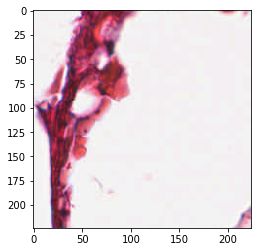

In [36]:
%matplotlib inline
import matplotlib.pyplot as plt 
plt.imshow(np.asarray(data['pannuke']['pannuke/fold1/1708/normal/upper_right/patch'][0], dtype=np.uint8))

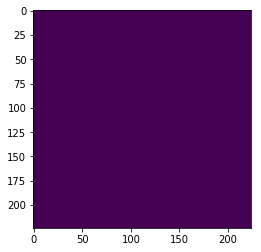

In [27]:
plt.imshow(np.asarray(data['pannuke']['pannuke/fold2/1542/normal/upper_right/mask'][0,:,:,0], dtype=np.uint8))

In [25]:
data['pannuke']['pannuke/fold2/1542/normal/upper_right/mask'][0][]

array([[[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        .